In [1]:
# kicking the tyres on the spatial model/voter perception of party position




In [2]:
# %%time
dataset_name = "W19_comb"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

Toggle code

2023-11-11 16:01:00,196 WARNING: panel.io.resources - Mimetype declaration for .js files was set to 'text/plain'. This will interefere with serving JS modules. Ensure your system does not override the mimetype declaration and/or contact your system administrator. 


In [4]:
## Are there any variables that *look* like a party-self gap?

In [5]:
# search(BES_reduced_with_na,"^taxSpend(Self|Con)")

In [6]:
# lrConSelfW18 = BES_reduced_with_na["taxSpendConW14__Government should increase taxes a lot and spend much more on health and social services"]\
#     -BES_reduced_with_na["taxSpendSelfW14__Government should increase taxes a lot and spend much more on health and social services"]

In [16]:
# lrConSelfW18corrs = BES_reduced_with_na.corrwith(lrConSelfW18)

In [17]:
# lrConSelfW18corrs.dropna().sort_values().head(50)

In [18]:
# lrCon/leftRightSelf
# Con
# high correlates - self pos, likeCon, ptvCon, generalElectionVoteUnsqueeze, 2019 vote, likeJohnson
# high anticorr - bestPM, lrConW18 (not others!), likeLab, likeCorbyn

# Lab - same pattern

In [19]:
# immig<party>/immigSelf
# Con
# high correlates - immigConW17, euPriorityBalance, dealPriorityImmig, EUIntegrationSelf, happyEULeave, immigrantsWelfareState
# high anticorr - immigSelf, immigCultural,asylumMore, bestPM,brexitSelf

In [20]:
# EUIntegrationSelf
# high corr - brexitSelf,dealVremain,remainVnodeal,euRefDoOver,bestPM,cantLiveWithEU_4
# high anticorr - EUIntegrationSelf,happyEULeave,euID,euRefVote


In [21]:
# TaxSpend
# high corr - leftRight,likeCon,generalElectionVoteUnsqueeze,ptvCon, likeMay/Johnson,howToReduceDeficitW11
# low corr - bestPM, preferConMajority,ptvLab,likeCorby,cutsTooFarNational

In [22]:
BES_Panel = pd.read_pickle("E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W24_comb\\BES2019_W24_Panel_v24.0.zip",compression='zip')
dataset_name = "W24_comb"

In [166]:
BES_Panel = pd.read_stata("E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W25_comb\\BES2019_W25_Panel_v25.0.dta")

In [167]:
BES_Panel.to_pickle("E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W25_comb\\BES2019_W25_Panel_v25.0.zip",compression='zip')

In [ ]:
BES_Panel = pd.read_pickle("E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W25_comb\\BES2019_W24_Panel_v24.0.zip",compression='zip')
dataset_name = "W25_comb"

In [165]:
save_folder = "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_output\\voter perception vector plots\\"
friendly_wave_description = BES_file_manifest.set_index("Wave No")["Friendlier_Description"].to_dict()
friendly_wave_description = {k:"BES W"+str(k)+"-"+v.replace("Election","Elec").replace("Campaign","Camp").replace("Referendum","Ref").replace("Elecs","Elec") for k,v in friendly_wave_description.items()}
friendly_wave_description[24] = 'BES W23-2022: December'
friendly_wave_description[25] = 'BES W23-2023: Spring'

In [24]:
# search(BES_Panel,"brexitCon")

In [25]:
# lr<Party> W20,21,22,23


In [26]:
# post W19 vars

# automationEffectsSelfW16 no Con,cvFreedomSelfW20,# leaveImpactSelf 8/10/15, workHomeCoronaSelf,mcVSelf1,mcVSelf2,
# mpVoteConstSelf,mpVotePartySelf,selfUSTie1,wcVself1,wcVself2
# cvSeveritySelf20/21/22/23 (no Con)

# brexitSelfW16 (ConW16)
# cvEconSelf20/21/22/23, (Con20/21/22/23)
# selfPriorities_ W17W20, party 1/2/3/4/6/9/17/20
# selfEUCertain 1/2/4/6/7, certaintyEUCon 1/2/4/6/7/8/14

In [27]:
list(set(["".join(x.split("W")[:-1]) for x in search(BES_Panel,"Johnson|Corbyn|Sunak|Starmer").index]))
# selfPriorities
# 

['likeSunak',
 'likeAlanJohnson',
 'EUIntegrationJohnson',
 'competentJohnson',
 'integrityJohnson',
 'competentStarmer',
 'polKnowSunak',
 'competentCorbyn',
 'integrityStarmer',
 'likeStarmer',
 'EUIntegrationCorbyn',
 'likeCorbyn',
 'likeJohnsonFormer',
 'labCandCorbynite',
 'likeJohnson',
 'lrCorbyn',
 'polKnowStarmer',
 'integrityCorbyn']

In [28]:
# EUIntegrationJohnson

In [29]:
## likeJohnson/likeCon pairs
# likeJohnsonFormer, likeTrussFormer, likeSunak, polKnowSunak

In [30]:
#  'stoppedorkPaySelf' ????

In [31]:
pan_dataset_allr_values = pd.read_pickle(BES_small_data_files + "pan_dataset_allr_valuesW19"+".zip",compression='zip')
# pan_dataset_allr_values = pan_dataset_allr_values.loc[BES_Panel.index].sort_index()
pan_dataset_ages = pd.read_pickle(BES_small_data_files + "pan_dataset_ages"+".zip", compression='zip')
pan_dataset_votes = pd.read_pickle(BES_small_data_files+"pan_dataset_votes"+".zip",compression='zip')

In [117]:
def relative_quiver(focal_var,self_var,wt_var,q,title,zlabel,second_self_var=None,second_focal_var=None,
                    weighted=True,mpl=False,only_quiver=False):

    al_scale_uni = pan_dataset_allr_values['Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully']
    al_scale_uni = pd.qcut(al_scale_uni,q).cat.codes.replace(-1,np.nan)

    lr_scale_uni = pan_dataset_allr_values['Economic: Left <-> Right{gaussian-ish}complete_fully']
    lr_scale_uni = pd.qcut(lr_scale_uni,q).cat.codes.replace(-1,np.nan)



    # focal perception - self perception
    self = BES_Panel[self_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
    if focal_var is None:
        distance = self        
    else:
        target = BES_Panel[focal_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
        distance = target-self       

    if second_focal_var is not None:
        self_second = BES_Panel[second_self_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)        
        target_second = BES_Panel[second_focal_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
        distance_second = target_second-self_second    
        
        
    # flip for immig
    if "immig" in self_var:
        distance = -distance
    if second_self_var is not None:
        if "immig" in second_self_var:
            distance_second = -distance_second

        
    if weighted:
        ct = pd.crosstab(
                al_scale_uni,        
                lr_scale_uni,
                values=list(zip(distance,BES_Panel[wt_var])) ,
                aggfunc=weighted_mean,    
                   )
        
        sample_size = al_scale_uni.notnull()&lr_scale_uni.notnull()&distance.notnull()&BES_Panel[wt_var].notnull()
        if second_focal_var is not None:       
            ct_second = pd.crosstab(
                    al_scale_uni,        
                    lr_scale_uni,
                    values=list(zip(distance_second,BES_Panel[wt_var])) ,
                    aggfunc=weighted_mean,    
                       )
            sample_size = sample_size&distance_second
        sample_size = sample_size.sum()
        
    else:
        ct = pd.crosstab(
                al_scale_uni,        
                lr_scale_uni,
                values=distance,
                aggfunc=np.mean,    
                   )        
        sample_size = al_scale_uni.notnull()&lr_scale_uni.notnull()&distance.notnull()
        if second_focal_var is not None:
            ct_second = pd.crosstab(
                    al_scale_uni,        
                    lr_scale_uni,
                    values=distance_second,
                    aggfunc=np.mean,    
                       )                       
            sample_size = sample_size&distance_second
        sample_size = sample_size.sum()

    X = np.arange(0, q, 1)
    Y = np.arange(0, q, 1)
    U, V = np.meshgrid(X, Y)
    U= (ct).values
    if second_focal_var is not None:
        V= (ct_second).values
    else:
        V[:]=0        
    xlabel = 'Economic: Left(0) <-> Right('+str(q-1)+')'
    ylabel = 'Social: Liberalism(0) <-> Conservatism('+str(q-1)+')'    
        
    
    if mpl==True:
        
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_figheight(5)
        fig.set_figwidth(15)
        fig.suptitle(title)           
        
        if only_quiver:
            fig,ax1 = plt.figure(figsize = (15,5))
            
            quiv = ax1.quiver(X, Y, U, V, scale=50)

            ax1.set_xlabel(xlabel);
            ax1.set_ylabel(ylabel);
            plt.show()
            return fig,sample_size
            
            
        else:
            
            sns.heatmap(ct[::-1],ax=ax1,cbar_kws={'label': zlabel})

            ax1.set_xlabel(xlabel);
            ax1.set_ylabel(ylabel);



            quiv = ax2.quiver(X, Y, U, V, scale=50)

            ax2.set_xlabel(xlabel);
            ax2.set_ylabel(ylabel);
            plt.show()
            return fig,sample_size
    
    else:

        opts.defaults(opts.VectorField()) # height=400, width=500

        mag = np.sqrt(U**2 + V**2)
        angle = (np.pi/2.) - np.arctan2(U/mag, V/mag)    
#         raise Exception
        vectorfield = hv.VectorField((X, Y, angle, mag)).opts(magnitude='Magnitude',
        #                                                       color='Magnitude',
                                                              #cmap='bwr',
                                                              xlabel=xlabel,ylabel=ylabel,
                                                              aspect=1,fig_inches=8)
        if only_quiver:
            return vectorfield.opts(title=title),sample_size
        
        triple_list = []
        for index in ct.index:
            for col in ct.columns:
                triple_list.append((col,index,ct.loc[index,col]))

        heatmap = hv.HeatMap(triple_list).opts(show_values=False,xlabel=xlabel,ylabel=ylabel,colorbar=True,clabel=zlabel)

        return (heatmap+vectorfield).opts(title=title),sample_size

    
    


global num_to_weight
def get_weights(dataset_name, BES_Panel):
    max_wave = int(re.match("W(\d+)_?",dataset_name).groups()[0])
    num_to_wave = {x:"W"+str(x) for x in range(1,max_wave+1)}
    ## problem here if it's *not* a combined panel!
    num_to_weight = { y:[x for x in BES_Panel.columns.sort_values(ascending=False) if re.match("wt_(new|full)_W"+str(y)+"($|_result$)",x)][0] for y in range(1,max_wave+1) }
    weights = BES_Panel[list(num_to_weight.values())].copy()
    return max_wave, num_to_wave, num_to_weight, weights

max_wave, num_to_wave, num_to_weight, weights = get_weights(dataset_name, BES_Panel)

import panel as pn
def make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,
                 second_self_stub=None,second_party_stub=None,only_quiver=False,compare_with_own_party=False):
    hv_dict={}
    wave_sample_size_dict = {}

    for party in party_list:
        for wave in wave_list:

            focal_var = party_stub+party+"W"+str(wave)
            if match(BES_Panel,focal_var+"$",case_sensitive=True).shape[0]==0:
                continue
            self_var = self_stub+"W"+str(wave)
            # ugly hack!
            if compare_with_own_party:
                if party in ["May","Cameron","Johnson","Sunak","Truss","ConLeader"]:
                    self_var = party_stub+"Con"+"W"+str(wave)
                elif party in ["Corbyn","Starmer","LabLeader"]:
                    self_var = party_stub+"Lab"+"W"+str(wave)
            
            wt_var = num_to_weight[wave]
            title = title_stub#+party+", wave"+str(wave)
            if second_self_stub is not None:
                second_self_var = second_self_stub+"W"+str(wave)
            else:
                second_self_var = None
            if second_party_stub is not None:                
                second_focal_var = second_party_stub+party+"W"+str(wave)
                if match(BES_Panel,second_focal_var+"$",case_sensitive=True).shape[0]==0:
                    continue
            else:
                second_focal_var=None
                
#             title=title+"\nPerception of "+party+" in "+friendly_wave_description[wave]
            hv_dict[party_stub+"_"+self_stub+"_"+party+"_W"+str(wave)],wave_sample_size_dict[wave] =\
                relative_quiver(focal_var=focal_var,self_var=self_var,wt_var=wt_var,q=q,title=title,zlabel=zlabel,
                                second_self_var=second_self_var,second_focal_var=second_focal_var,only_quiver=only_quiver) 
                
            hv_dict[party_stub+"_"+self_stub+"_"+party+"_W"+str(wave)]\
                .opts(title=title+"\nPerception of "+party+" in "+friendly_wave_description[wave]+\
                " (N="+str(wave_sample_size_dict[wave])+")"
                                                                           )
        
            hv.save(hv_dict[party_stub+"_"+self_stub+"_"+party+"_W"+str(wave)],
                    save_folder+party_stub+"_"+self_stub+"_"+party+"_W"+str(wave)+'.png')
            
            hv_dict[party_stub+"_"+self_stub+"_"+party+"_W"+str(wave)].opts(title=title)
#     max_wave = max(friendly_wave_description.keys())
    
    waves = hv.Dimension(('wave','BES sample wave'),
                         #range=(1,max_wave),
                         values = [friendly_wave_description[x]+" N="+str(wave_sample_size_dict[x]) for x in wave_list])
                         
                         #list(friendly_wave_description.values())[::-1])
    
    hv.output(backend='matplotlib',fig='svg', holomap='widgets', dpi=80,widget_location='bottom',)
        # size=100
    hm = hv.HoloMap({(x.split("_")[2],friendly_wave_description[int(x.split("_W")[-1])]\
                          +" N="+str(wave_sample_size_dict[int(x.split("_W")[-1])])):hv_dict[x] for x in hv_dict.keys()},
               kdims=["option chosen", waves],)
#     holomap_panel = pn.panel(hm.collate())
#     plot = holomap_panel[0]
#     widgets = holomap_panel[1]    
    
    return hm.collate()    
    

In [118]:
# search(BES_Panel,"lrCon|likeCon|al_scale|lr_scale|leftRight")

# lr<party,like<party>

In [119]:
# search(BES_Panel,"lrCon|leftRight|al_scale|leftRight")

In [120]:
# search(BES_Panel,"natSecurity|taxSpend|EUIntegration")

In [121]:
# first off, a plot of where people on al_scale place themselves on the leftRight scale
# second a plot of where they place <party>
# third a plot of where they place <party> relative to themselves

In [122]:
# We want a vector plot

# https://matplotlib.org/3.1.1/gallery/images_contours_and_fields/quiver_demo.html#sphx-glr-gallery-images-contours-and-fields-quiver-demo-py

In [123]:
# set([x.split("W")[0] for x in search(BES_Panel,"Self").index])

In [124]:
# search(BES_Panel,"^EUIntegrationSelfW").sort_index()

In [125]:
# natSecuritySelf W4W7W10W11W13,
# taxSpendSelf W14W15W16,
# redistSelf W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19,
# immigSelf W7W8W9W10W11W12W13W14W15W16W17,
# EUIntegrationSelf W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19
# eesEUIntegrationSelf W1W2W3W4W6
# leftRight - every wave!

In [126]:
# brexitSelfW16 (ConW16)
# cvEconSelf20/21/22/23, (Con20/21/22/23)
# selfPriorities_ W17W20, party 1/2/3/4/6/9/17/20
# selfEUCertain 1/2/4/6/7, certaintyEUCon 1/2/4/6/7/8/14

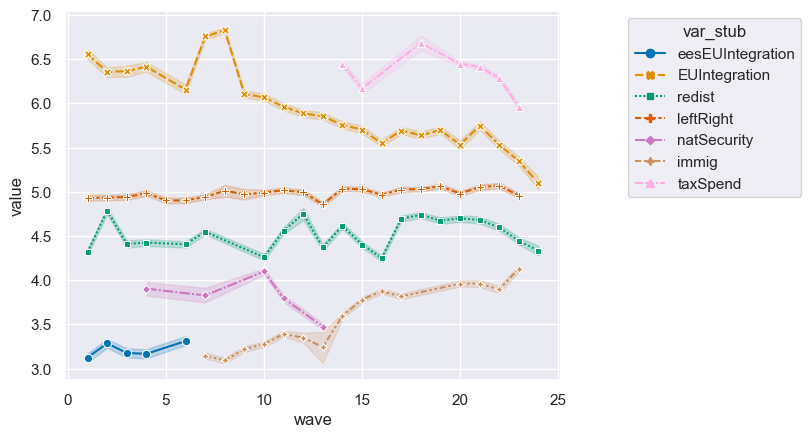

In [127]:
df = BES_Panel[search(BES_Panel,"natSecuritySelf|taxSpendSelf|redistSelf|immigSelf|EUIntegrationSelf|eesEUIntegrationSelf|leftRight").index].apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).melt()

df["var_stub"] = df["variable"].apply(lambda x: x.split("W")[0].split("Self")[0])
df["wave"] = df["variable"].apply(lambda x: int(x.split("W")[1]))
g = sns.lineplot(data=df,x="wave",y="value",hue="var_stub",markers=True,style="var_stub")
sns.move_legend(g, "upper right", bbox_to_anchor=(1.5, 1))

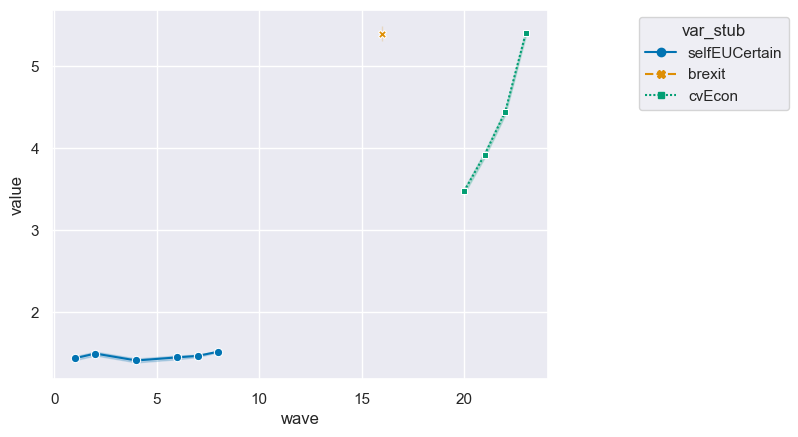

In [128]:
df = BES_Panel[search(BES_Panel,"cvEconSelf|brexitSelf|selfEUCertain").index].apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).melt()

df["var_stub"] = df["variable"].apply(lambda x: x.split("W")[0].split("Self")[0])
df["wave"] = df["variable"].apply(lambda x: int(x.split("W")[1]))
g = sns.lineplot(data=df,x="wave",y="value",hue="var_stub",markers=True,style="var_stub")
sns.move_legend(g, "upper right", bbox_to_anchor=(1.5, 1))

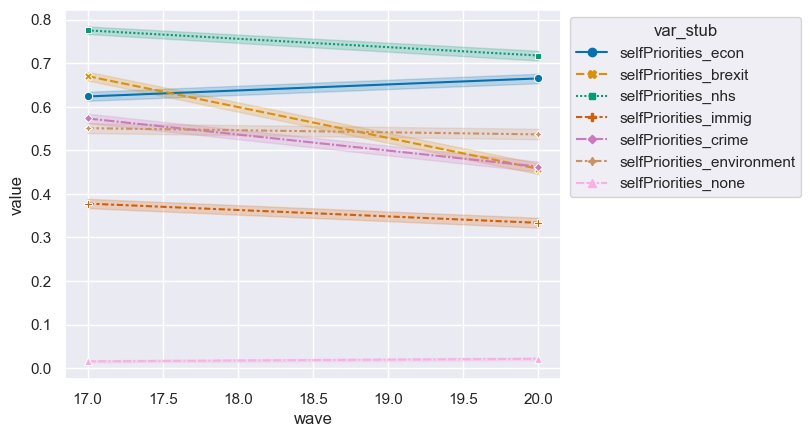

In [129]:
df = BES_Panel[search(BES_Panel,"selfPriorities_").index].apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).melt()

df["var_stub"] = df["variable"].apply(lambda x: x.split("W")[0].split("Self")[0])
df["wave"] = df["variable"].apply(lambda x: int(x.split("W")[1]))
g = sns.lineplot(data=df,x="wave",y="value",hue="var_stub",markers=True,style="var_stub")
sns.move_legend(g, "upper right", bbox_to_anchor=(1.5, 1))

In [130]:
# redist, leftRight - very flat (avg!)
# eesEUIntegration - flat (small trend?)
# EUIntegration - bump around euref, otherwise linear drop
# natSecurity/taxSpend too short to tell
# immig - dramatic linear shift

In [131]:
### I wonder if there's any variables that act *like* the Self-Party gap?

In [132]:
# natSecurityCon W4W7W10W11W13,
# taxSpendCon W14W15W16,
# redistCon W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19,
# immigCon W7W8W9W10W11W12W13W14W15W16W17,
# EUIntegrationCon W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19
# eesEUIntegrationCon W1W2W3W4W6
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18
# lrCameronW7W8,lrCorbynW7W8W12,lrMayW12
# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16

In [133]:
# match(BES_Panel,".*SelfW")



In [134]:
## NOTE SOME "certaintyRedist<Party>"

In [135]:
# first off, a plot of where people on al_scale place themselves on the leftRight scale

In [136]:
# sns.heatmap(ct)

In [137]:
# leftRightW21       30281
# lrConW21           30281
# al_scaleW21        25692
# lr_scaleW21        25692?

In [138]:
### everything will be so much easier with uniform data!

In [139]:
# search(BES_Panel,"leftRight|lrCon")

In [140]:
# search(BES_Panel,"lr.*W17")

In [141]:
pan_dataset_allr_values.shape

(97006, 10)

In [142]:
BES_Panel.shape

(97006, 9837)

In [143]:
BES_Panel = BES_Panel.set_index("id").loc[pan_dataset_allr_values.index].reset_index()

# drop all individuals
BES_Panel.index = BES_Panel["id"]

In [144]:
BES_Panel[["wave19","wave20","wave21","wave22","wave23","wave24"]].sum()

# 3/4

wave19    32177.0
wave20    27061.0
wave21    25330.0
wave22    24313.0
wave23    25642.0
wave24    12968.0
dtype: float64

In [145]:
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [146]:
%matplotlib inline

:VectorField   [x,y]   (Angle,Magnitude)
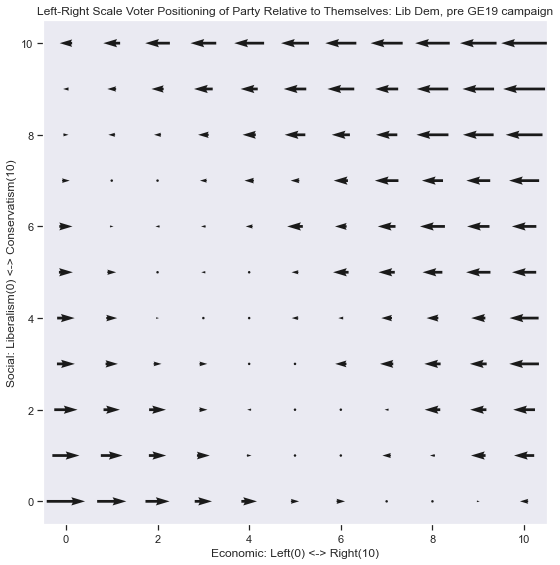

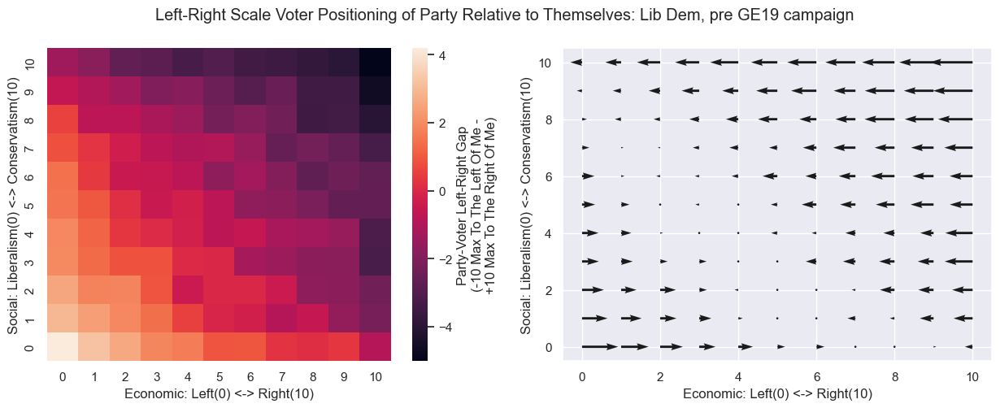

In [147]:
    
focal_var = "lrLDW17"
self_var = "leftRightW17"
wt_var = "wt_new_W17"
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: Lib Dem, pre GE19 campaign"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
weighted=True

al_scale_uni = pan_dataset_allr_values['Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully']
al_scale_uni = pd.qcut(al_scale_uni,q).cat.codes.replace(-1,np.nan)

lr_scale_uni = pan_dataset_allr_values['Economic: Left <-> Right{gaussian-ish}complete_fully']
lr_scale_uni = pd.qcut(lr_scale_uni,q).cat.codes.replace(-1,np.nan)

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figheight(5)
fig.set_figwidth(15)
fig.suptitle(title)

# focal perception - self perception
self = BES_Panel[self_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
if focal_var is None:
    distance = self        
else:
    target = BES_Panel[focal_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
    distance = target-self

if weighted:
    ct = pd.crosstab(
            lr_scale_uni,        
            al_scale_uni,
            values=list(zip(distance,BES_Panel[wt_var])) ,
            aggfunc=weighted_mean,    
               )
else:
    ct = pd.crosstab(
            lr_scale_uni,        
            al_scale_uni,
            values=list(zip(distance,BES_Panel[wt_var])) ,
            aggfunc=weighted_mean,    
               )        

sns.heatmap(ct[::-1],ax=ax1,cbar_kws={'label': zlabel})
xlabel = 'Economic: Left(0) <-> Right('+str(q-1)+')'
ylabel = 'Social: Liberalism(0) <-> Conservatism('+str(q-1)+')'
ax1.set_xlabel(xlabel);
ax1.set_ylabel(ylabel);

X = np.arange(0, q, 1)
Y = np.arange(0, q, 1)
U, V = np.meshgrid(X, Y)
V[:]=0

quiv = ax2.quiver(X, Y, (ct).values, V, scale=50)

ax2.set_xlabel(xlabel);
ax2.set_ylabel(ylabel);
# plt.show()


opts.defaults(opts.VectorField()) # height=400, width=500
U= (ct).values
mag = np.sqrt(U**2 + V**2)
angle = (np.pi/2.) - np.arctan2(U/mag, V/mag)    
vectorfield = hv.VectorField((X, Y, angle, mag)).opts(magnitude='Magnitude',
#                                                       color='Magnitude',
                                                      #cmap='bwr',
                                                      xlabel=xlabel,ylabel=ylabel)

vectorfield.opts(title=title,fig_inches=10,aspect=1)
                 
                 #fig_size=(20,10))
#                  height=400, width=500)
# triple_list = []
# for index in ct.index:
#     for col in ct.columns:
#         triple_list.append((index,col,ct.loc[index,col]))

# heatmap = hv.HeatMap(triple_list).opts(show_values=False,xlabel=xlabel,ylabel=ylabel,colorbar=True,clabel=zlabel)

# (heatmap+vectorfield).opts(title=title)

In [148]:
al_scale_uni.shape

(97006,)

:Layout
   .HeatMap.I     :HeatMap   [x,y]   (z)
   .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)
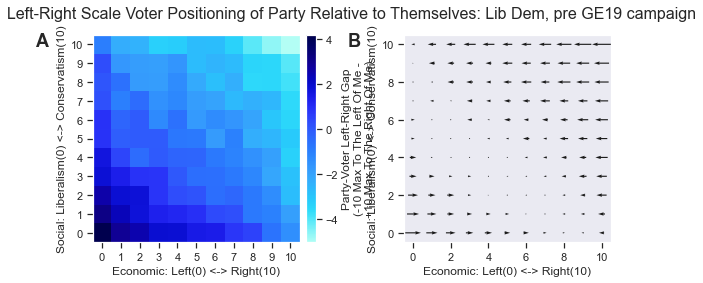

In [149]:
    
focal_var = "lrLDW17"
self_var = "leftRightW17"
wt_var = "wt_new_W17"
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: Lib Dem, pre GE19 campaign"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
plot,ss = relative_quiver(focal_var,self_var,wt_var,q,title,zlabel)
plot

:Layout
   .HeatMap.I     :HeatMap   [x,y]   (z)
   .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)
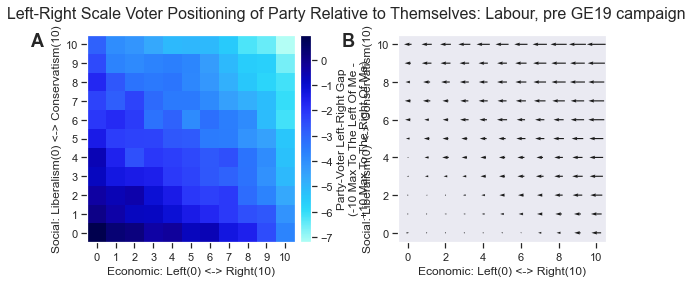

In [150]:
focal_var = "lrLabW17"
self_var = "leftRightW17"
wt_var = "wt_new_W17"
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: Labour, pre GE19 campaign"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
plot,ss = relative_quiver(focal_var,self_var,wt_var,q,title,zlabel)
plot

:Layout
   .HeatMap.I     :HeatMap   [x,y]   (z)
   .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)
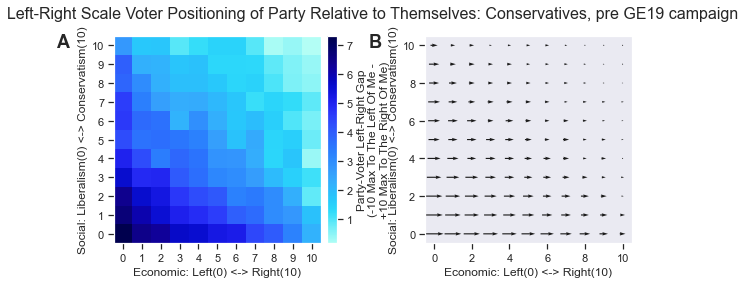

In [151]:
focal_var = "lrConW17"
self_var = "leftRightW17"
wt_var = "wt_new_W17"
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: Conservatives, pre GE19 campaign"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
plot,ss = relative_quiver(focal_var,self_var,wt_var,q,title,zlabel)
plot

:Layout
   .HeatMap.I     :HeatMap   [x,y]   (z)
   .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)
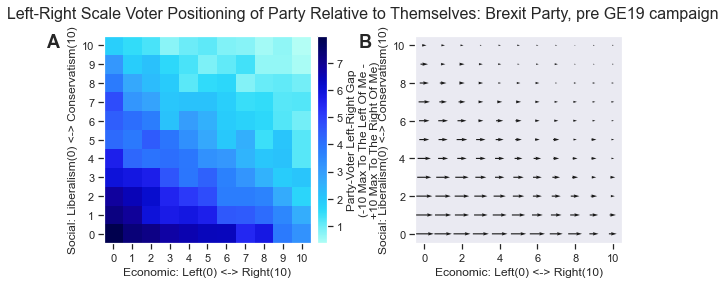

In [152]:
focal_var = "lrBrexitW17"
self_var = "leftRightW17"
wt_var = "wt_new_W17"
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: Brexit Party, pre GE19 campaign"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
plot,ss = relative_quiver(focal_var,self_var,wt_var,q,title,zlabel)
plot

:Layout
   .HeatMap.I     :HeatMap   [x,y]   (z)
   .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)
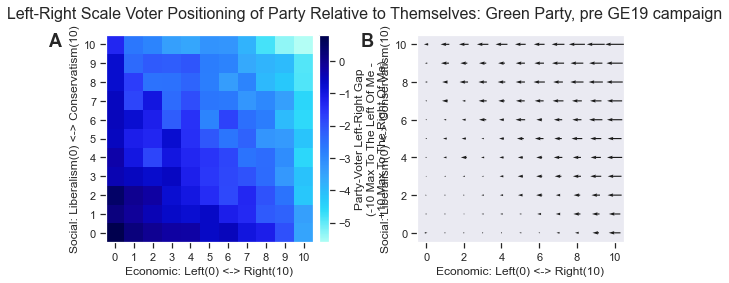

In [153]:
focal_var = "lrgreensW17"
self_var = "leftRightW17"
wt_var = "wt_new_W17"
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: Green Party, pre GE19 campaign"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
plot,ss = relative_quiver(focal_var,self_var,wt_var,q,title,zlabel)
plot

:Layout
   .HeatMap.I     :HeatMap   [x,y]   (z)
   .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)
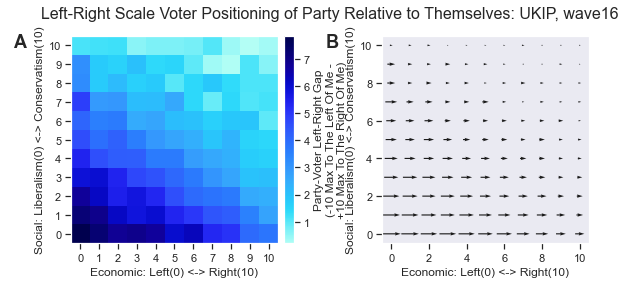

In [154]:
wave = 16
party = "UKIP"
party_stub = "lr"
self_stub = "leftRight"
focal_var = party_stub+party+"W"+str(wave)
self_var = self_stub+"W"+str(wave)
wt_var = num_to_weight[wave]
q = 11
title = "Left-Right Scale Voter Positioning of Party Relative to Themselves: "+party+", wave"+str(wave)
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
plot,ss = relative_quiver(focal_var,self_var,wt_var,q,title,zlabel)
plot

In [155]:
## party_stub, self_stub, party_list, wave_list

:HoloMap   [wave,option chosen]
   :VectorField   [x,y]   (Angle,Magnitude)
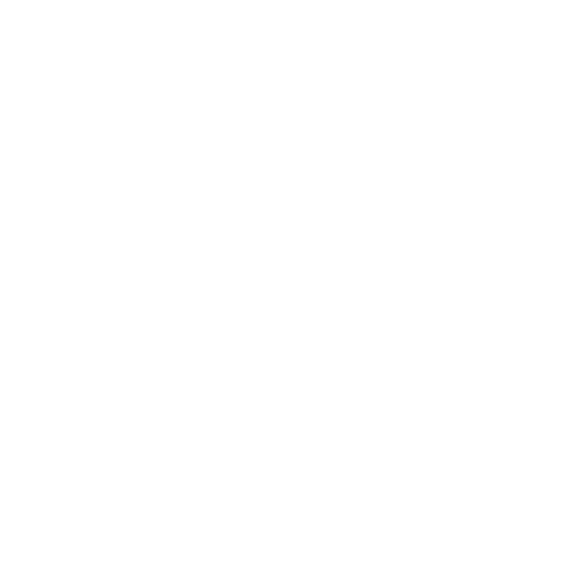
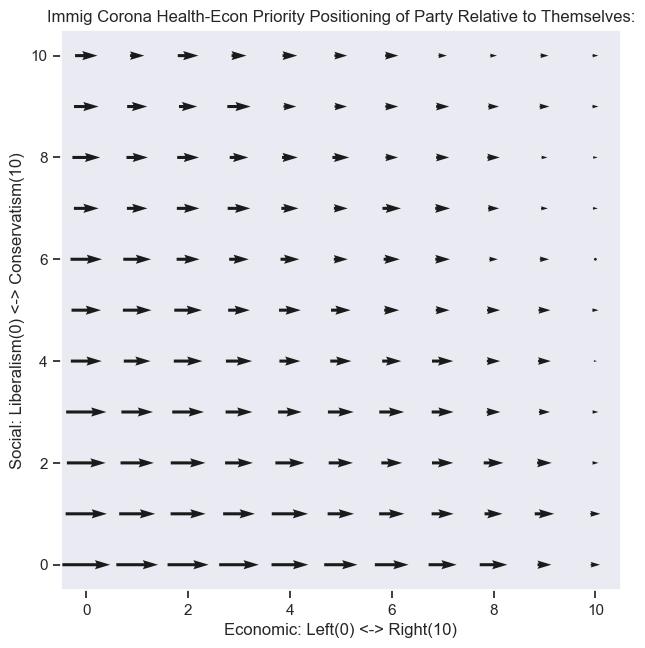
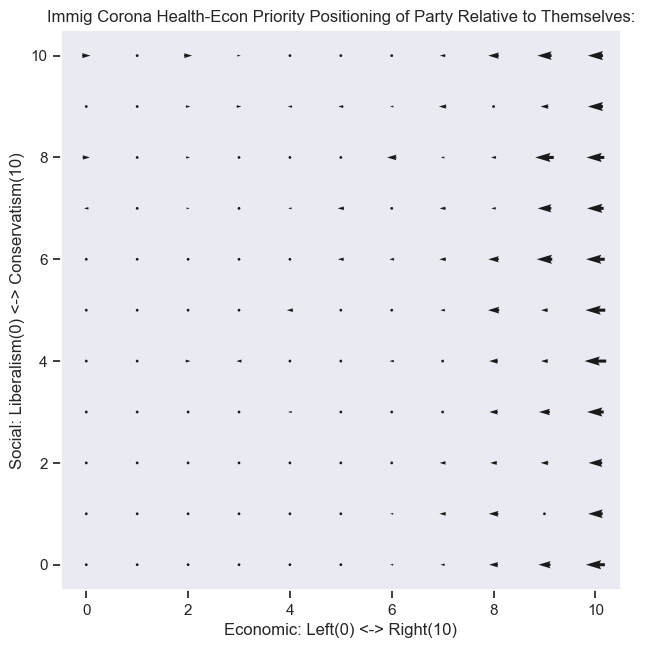
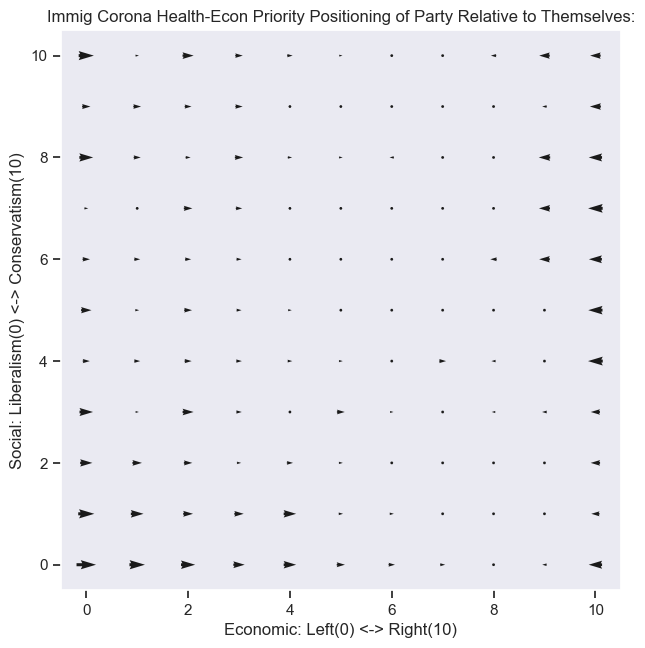
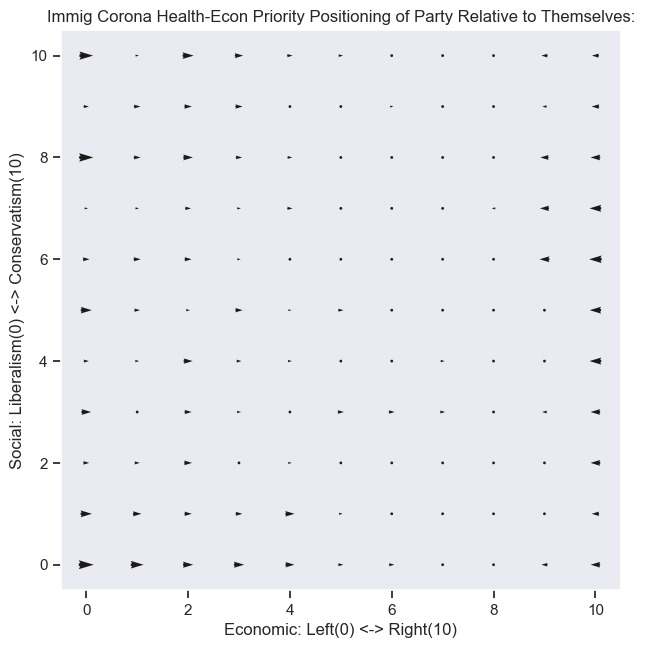
...
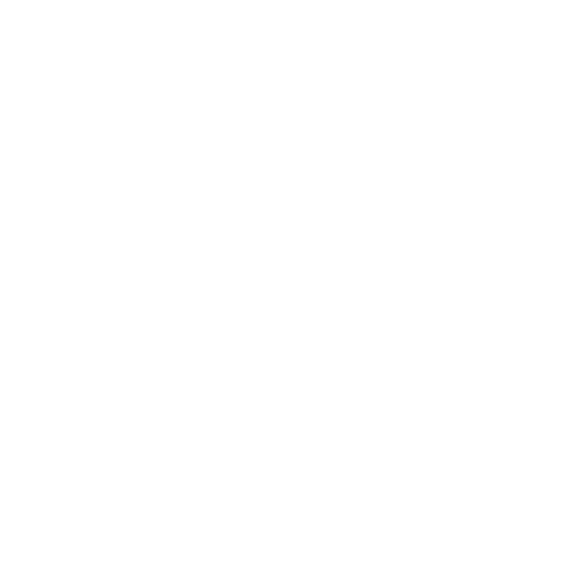
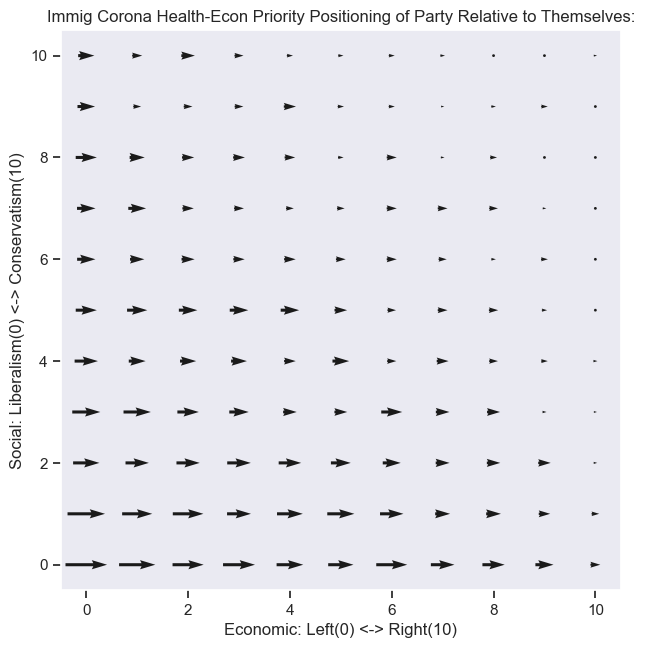
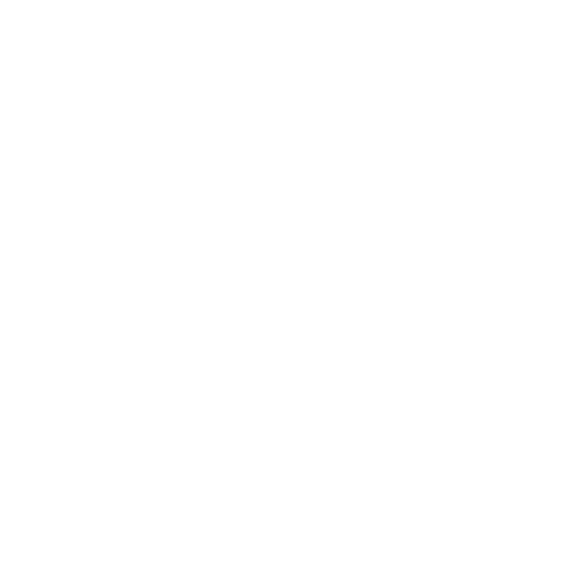
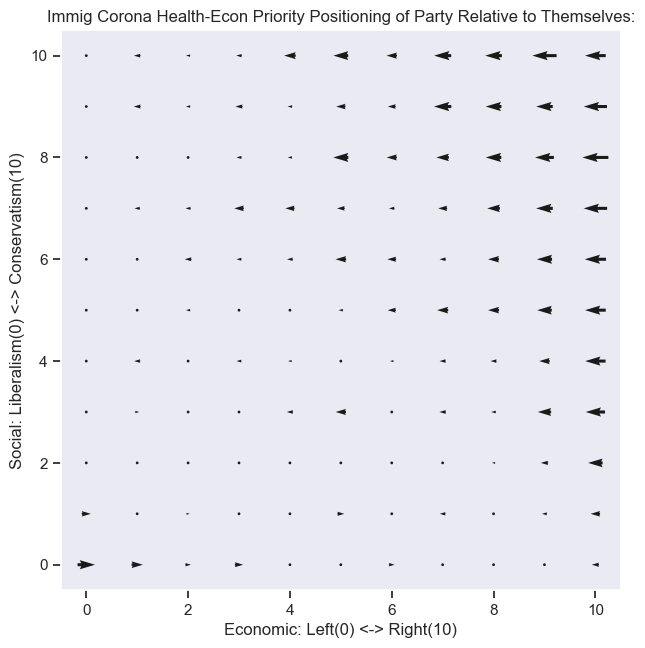
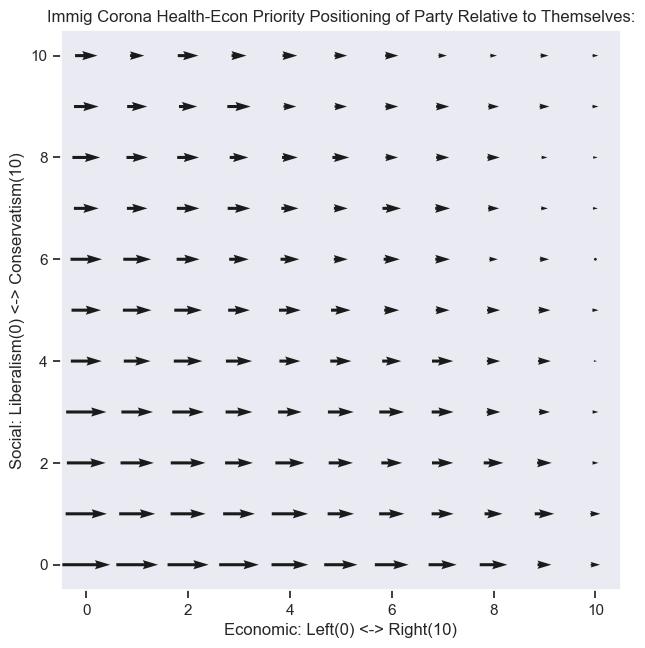

In [156]:
# cvEconSelf20/21/22/23, (Con20/21/22/23)
# Reduce infections even if it damages the economy - Save the economy even if it increases infections
party_stub = "cvEcon"
self_stub = "cvEconSelf"
zlabel = "Party-Voter Corona Health-Econ Priority Gap\n(-10 Max Prioritise Health More Than Me -\n+10 Max Prioritise Econ More Than Me)"
title_stub = "Immig Corona Health-Econ Priority Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP","Brexit"]
wave_list = [20,21,22,23]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


:HoloMap   [wave,option chosen]
   :VectorField   [x,y]   (Angle,Magnitude)
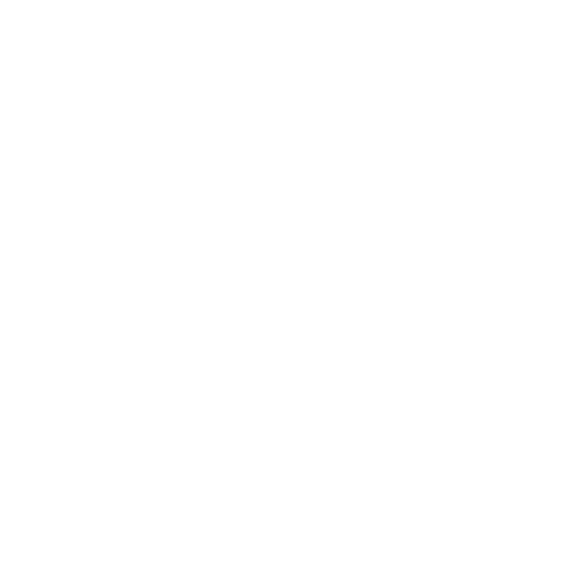
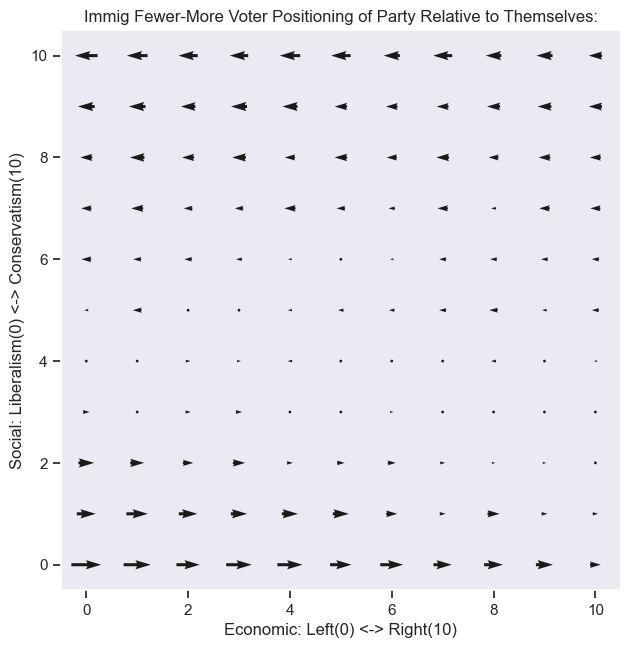
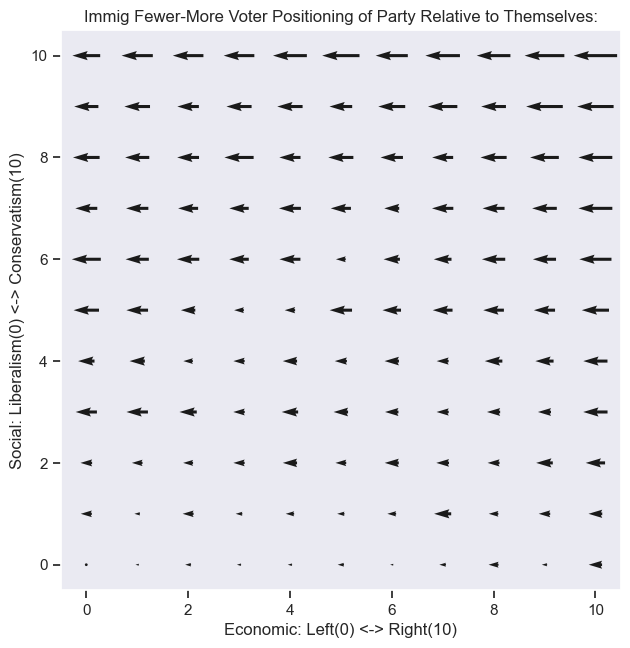
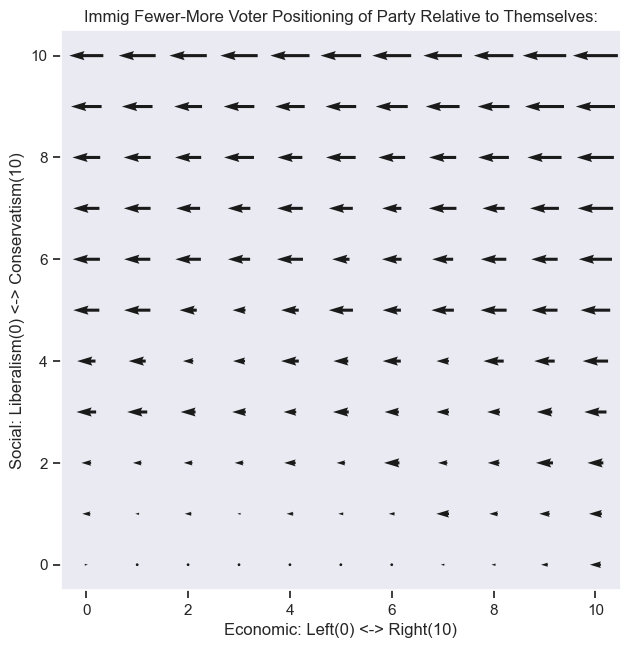
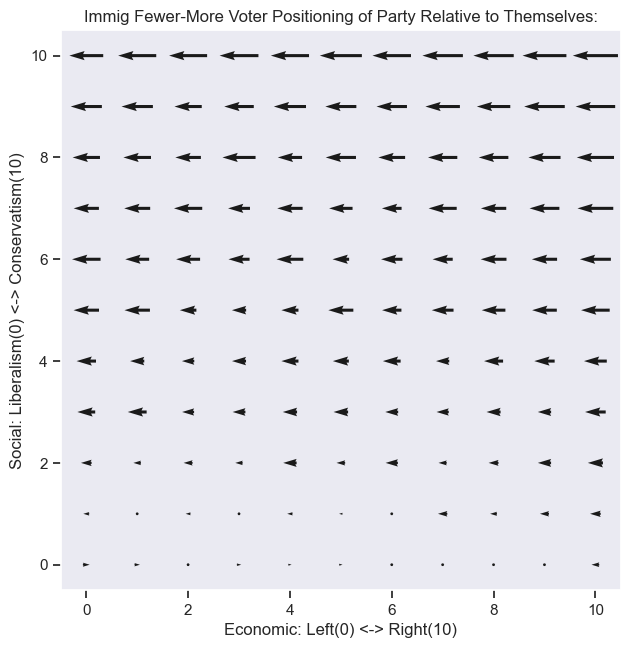
...
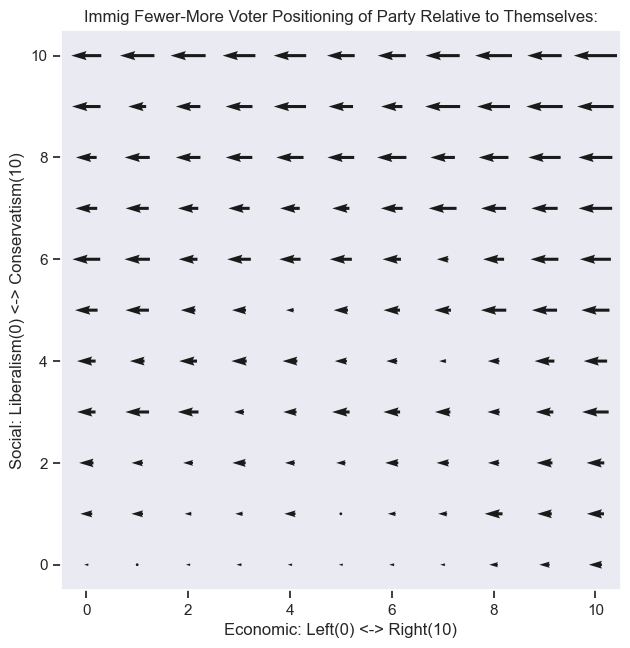
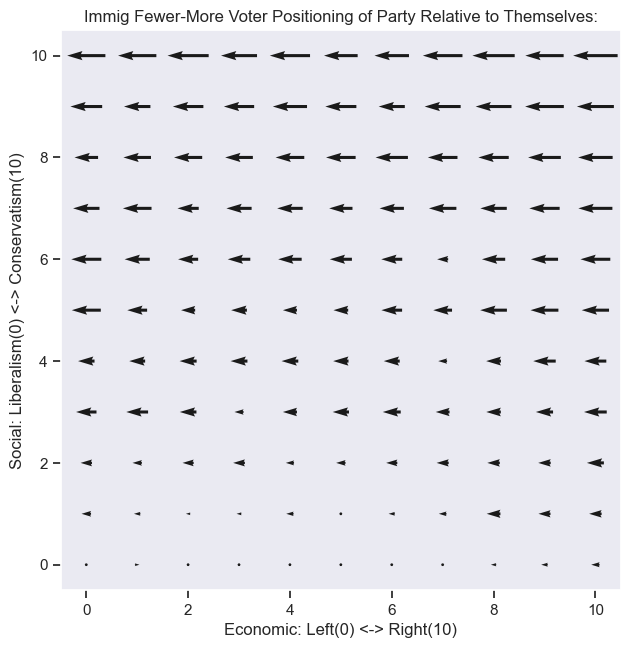
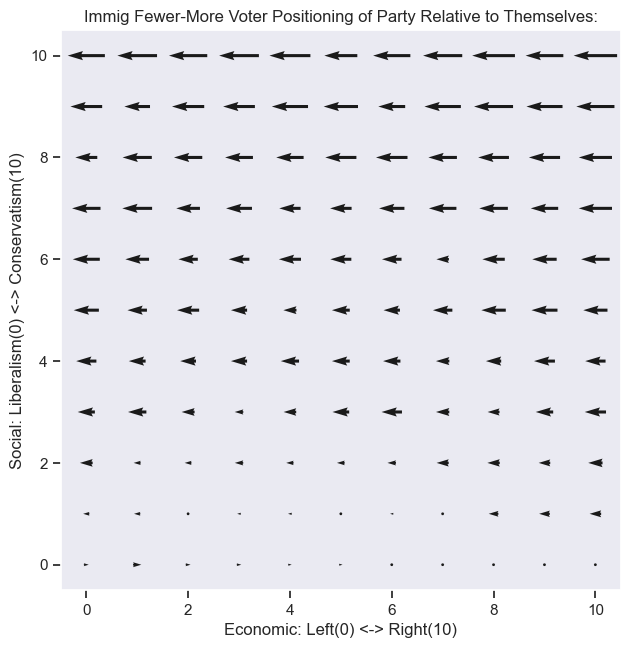
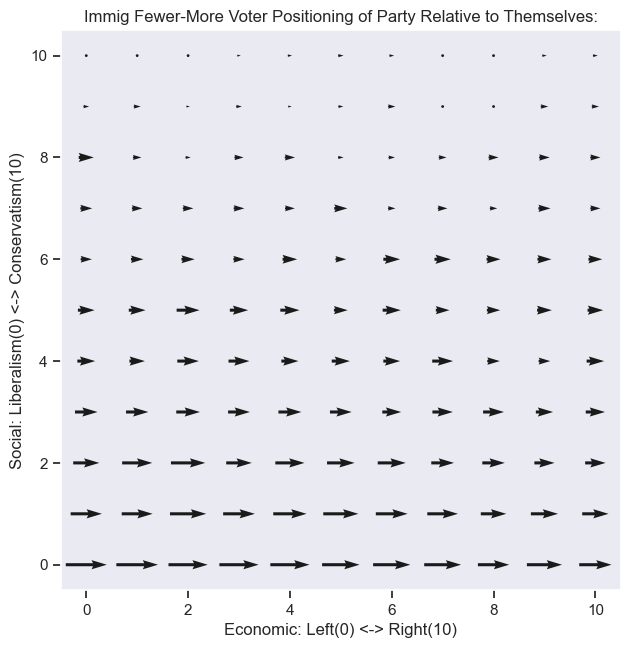
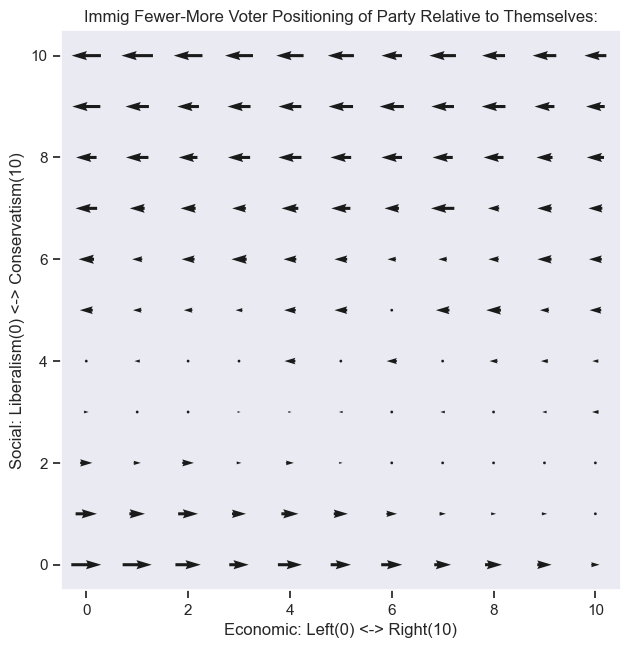

In [157]:
# immigSelf W7W8W9W10W11W12W13W14W15W16W17W20W21W22W23
# immigCon  W7W8W9W10W11W12W13W14W15W16W17W20W21w22W23

party_stub = "immig"
self_stub = "immigSelf"
zlabel = "Party-Voter Immig Fewer-More Gap\n(-10 Max Fewer Than Me -\n+10 Max More Than Me)"
title_stub = "Immig Fewer-More Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP","Brexit","TIG"]
wave_list = [7,8,9,10,11,12,14,15,16,17,20,21,22,23]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


:HoloMap   [wave,option chosen]
   :VectorField   [x,y]   (Angle,Magnitude)
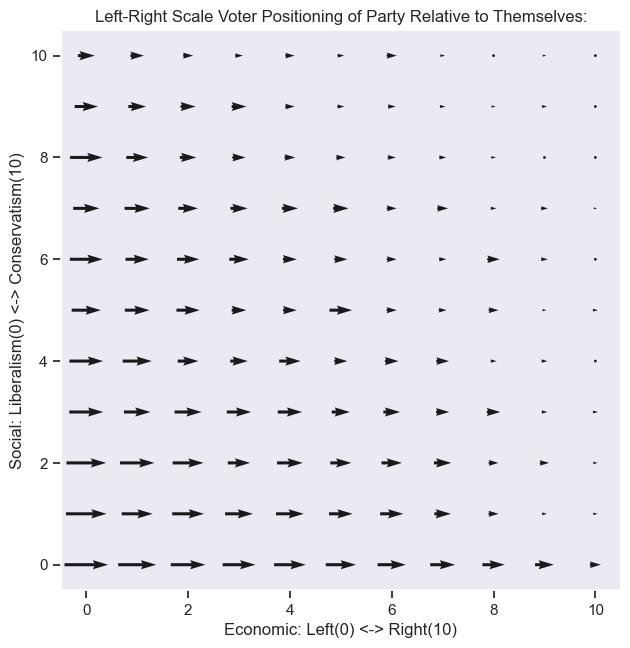
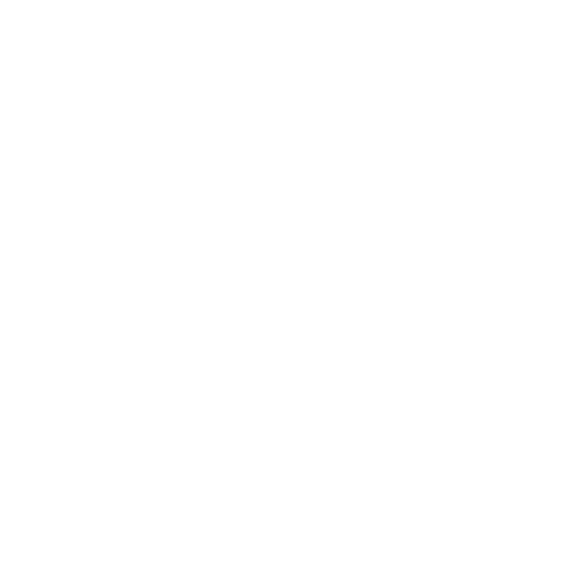
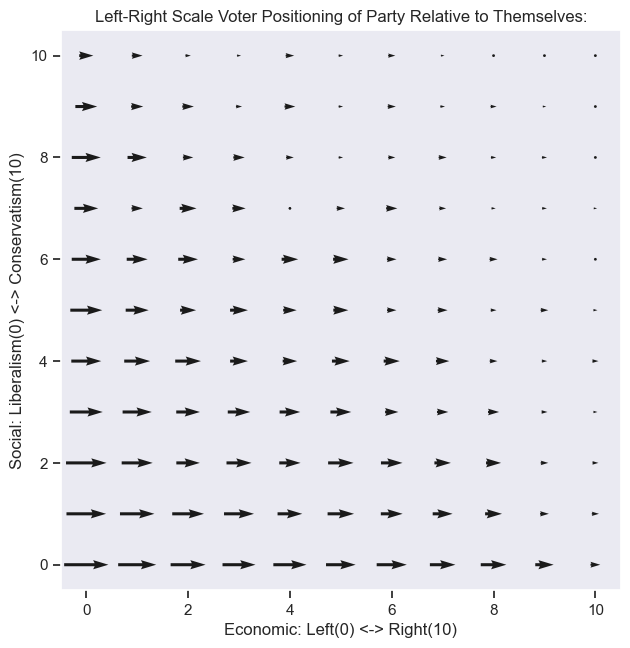
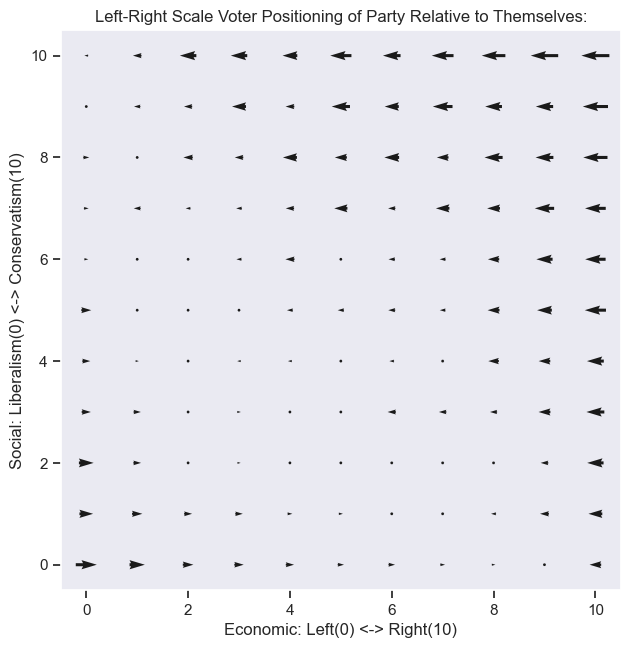
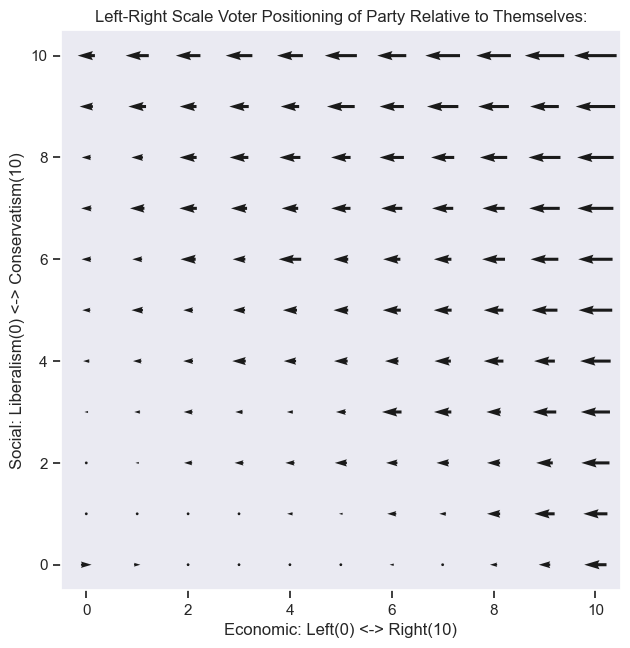
...
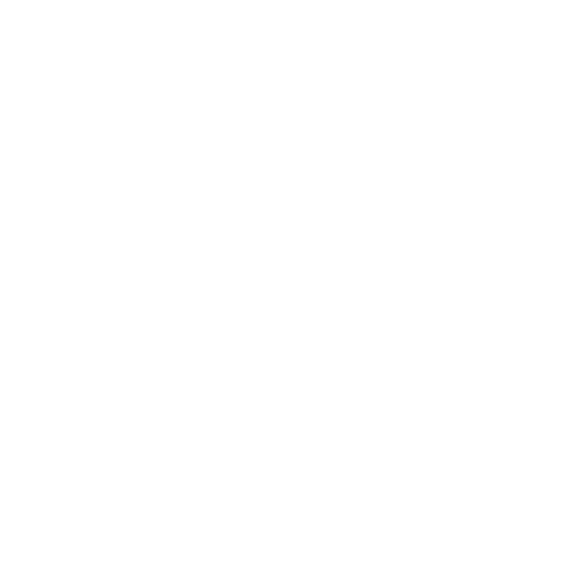
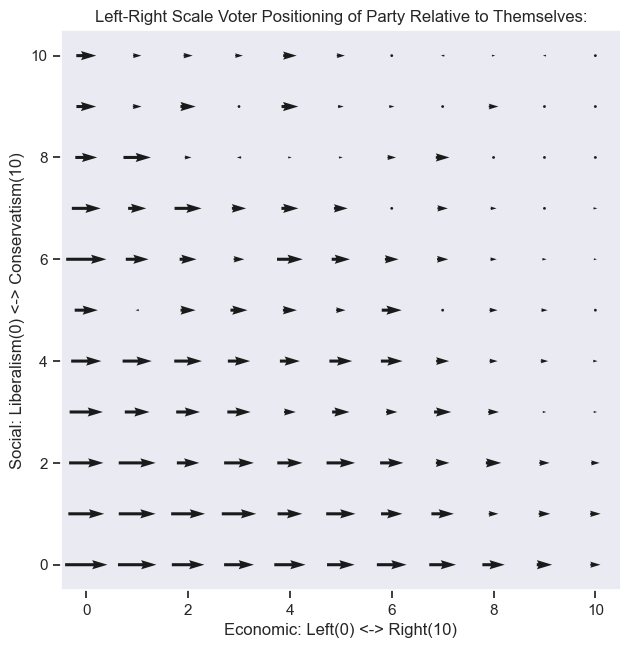
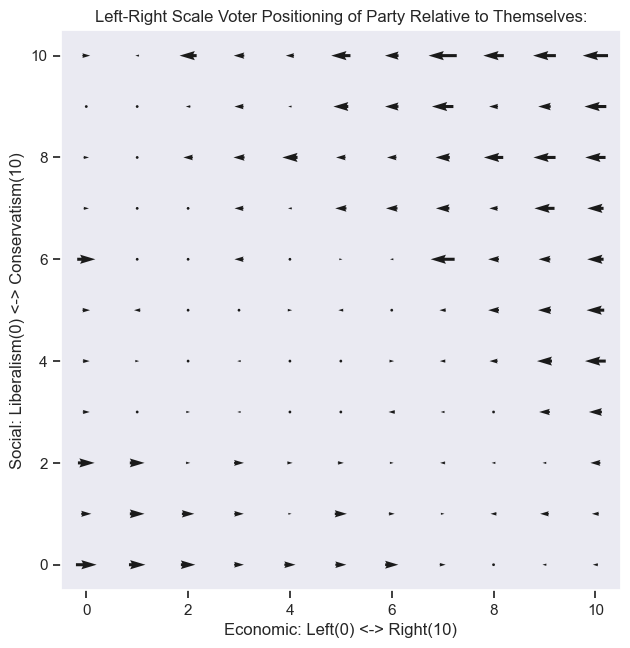
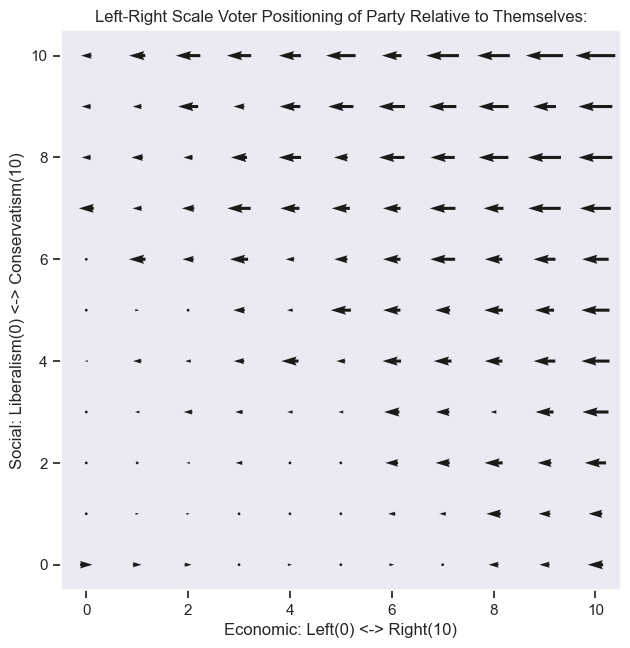
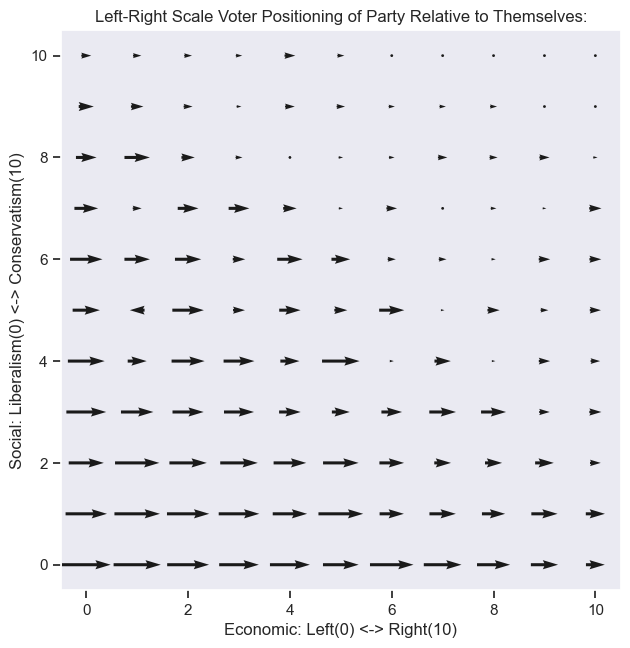

In [158]:
# leftRight - every wave!
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18W20W21W22W23

party_stub = "lr"
self_stub = "leftRight"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
title_stub = "Left-Right Scale Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP","Brexit","TIG"]
wave_list = [2,3,4,5,6,7,8,9,10,11,12,15,16,17,18,20,21,22,23]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


In [160]:
friendly_wave_description

{23: 'BES W23-2022: Spring',
 22: 'BES W22-2022: Winter',
 21: 'BES W21-2021: Summer',
 20: 'BES W20-2020: Summer',
 19: 'BES W19-2019 GE: Post-Elec',
 18: 'BES W18-2019 GE: Camp',
 17: 'BES W17-2019 GE: Pre-Camp',
 16: 'BES W16-2019 : Post Euro Elec',
 15: 'BES W15-2019: Spring',
 14: 'BES W14-2018: Summer',
 13: 'BES W13-2017 GE: Post-Elec',
 12: 'BES W12-2017 GE: Camp',
 11: 'BES W11-2017 GE: Pre-Camp',
 10: 'BES W10-2016: Autumn',
 9: 'BES W9-2016 EU Ref: Post-Ref',
 8: 'BES W8-2016 EU Ref: Camp',
 7: 'BES W7-2016: Pre Local Elec',
 6: 'BES W6-2015 GE: Post-Elec',
 5: 'BES W5-2015 GE: Camp',
 4: 'BES W4-2015 GE: Pre-Camp',
 3: 'BES W3-2014: Autumn',
 2: 'BES W2-2014: Summer',
 1: 'BES W1-2014: Spring'}

In [159]:
# redistSelf W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19W20W21W22W23W24
# redistCon  W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19W20W21W22W23W24

party_stub = "redist"
self_stub = "redistSelf"
zlabel = "Party-Voter Redist Gap\n(-10 Max Make Incomes Equal -\n+10 Max Don't)"
title_stub = "Redistribution To Equalise Incomes Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP","Brexit","TIG"]
wave_list = [1,2,3,4,6,7,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


KeyError: 24

In [ ]:
# EUIntegrationSelf W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19W20W21W22W23W24
# EUIntegrationCon  W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19W20W21W22W24W24

party_stub = "EUIntegration"
self_stub = "EUIntegrationSelf"
zlabel = "Party-Voter EUIntegration Gap\n(-10 Max More Unite With EU -\n+10 Max More Protect Independence)"
title_stub = "EUIntegration Scale Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP","Brexit","TIG"]
wave_list = [1,2,3,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


In [ ]:
# eesEUIntegrationSelf W1W2W3W4W6
# eesEUIntegrationCon W1W2W3W4W6

party_stub = "eesEUIntegration"
self_stub = "eesEUIntegrationSelf"
zlabel = "Party-Voter eesEUIntegration Gap\n(-10 Max Unification Gone Too Far -\n+10 Max More Unification)"
title_stub = "eesEUIntegration Scale Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP",]
wave_list = [1,2,3,4,6,]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


In [ ]:
# taxSpendSelf W14W15W18W20W21W22W23
# taxSpendCon  W14W15W18W20W21W23

party_stub = "taxSpend"
self_stub = "taxSpendSelf"
zlabel = "Party-Voter taxSpend Gap\n(-10 Max Tax Less Spend Less -\n+10 Max Tax More Spend More)"
title_stub = "taxSpend Scale Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Green","UKIP","Brexit","TIG"]
wave_list = [14,15,18,20,21,23]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


In [ ]:
# brexitSelf W16,
# brexitCon W16,

party_stub = "brexit"
self_stub = "brexitSelf"
zlabel = "Party-Voter Brexit Gap\n(-10 Max More No-Deal-y -\n+10 Max More Remain-y)"
title_stub = "Brexit No-Deal vs Remain Scale Voter Positioning of Party Relative to Themselves: "
party_list = ["Con","Lab","LD","Grn","UKIP","Brexit","TIG"]
wave_list = [16]
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)


In [ ]:
# natSecuritySelf W4W7W10W11W13,
# natSecurityCon W4W7W10W11W13,

party_list = ["Con","Lab","LD","Grn","UKIP","Brexit","TIG"]
wave_list = [4,7,10,11,13]
party_stub = "natSecurity"
self_stub = "natSecuritySelf"
zlabel = "Party-Voter natSecurity Gap\n(-10 Max More Fight Terrorism -\n+10 Max More Protect Civil Liberties)"
title_stub = "natSecurity Scale Voter Positioning of Party Relative to Themselves: "

# make_hv_plot(self_var,self_stub,focal_var,party_stub,wt_var,q,title,zlabel,party_list,wave_list,max_wave)
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,only_quiver=True)#,
#                  second_self_stub=None,second_party_stub=None,only_quiver=False,compare_with_own_party=False)

In [ ]:
## possibility of paired variables


# match(BES_Panel,"natSecurityCon|taxSpendCon|redistCon|immigCon|EUIntegrationCon|eesEUIntegrationCon").sort_index()
# natSecurityCon W4W7W10W11W13,
# taxSpendCon W14W15W16,
# redistCon W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19,
# immigCon W7W8W9W10W11W12W13W14W15W16W17,
# EUIntegrationCon W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19
# eesEUIntegrationCon W1W2W3W4W6
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18
# lrCameronW7W8,lrCorbynW7W8W12,lrMayW12
# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16



In [ ]:
# immigCon  W7W10W11W12W13W14W15W16W17,
# redistCon W7W10W11W12W13W14W15W16W17,
# overlap  W7W10W11W12W13W14W15W16W17,

In [ ]:
# BES_Panel["natSecurityConW4"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)

In [ ]:
BES_Panel[match(BES_Panel,"leftRightW").index]\
    .apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).corrwith(pan_dataset_allr_values['Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully'])\
    .sort_values().head(50)

In [ ]:
BES_Panel[match(BES_Panel,"(taxSpend)(Self)W").index]\
    .apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).corrwith(pan_dataset_allr_values['Economic: Left <-> Right{gaussian-ish}complete_fully'])\
    .sort_values()#.tail(50)
#.describe().loc["unique"].sort_values()

# immigSelf - ~60% correlate with auth
# natSecurity - ~50% correlate with auth
# EUIntegration - ~50% correlate with auth
# leftRight - ~45% correlate with auth
# redistSelf ~ 15-20% correlate with auth

# taxSpend - ~30% correlate with ec lr (~18% with auth)
# redistSelf - ~60% correlate with ec lr
# leftRight - ~50% correlate with ec lr
# immigSelf ~10-15% correlate with ec lr


In [ ]:
searc

In [ ]:
# leftRight - every wave!
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18

party_stub = "lr"
self_stub = "leftRight"
zlabel = "Party-Voter Left-Right Gap\n(-10 Max To The Left Of Me -\n+10 Max To The Right Of Me)"
title_stub = "Left-Right Scale Voter Positioning of Party Relative to Themselves: "

party_list = ["Con","Lab","LD","greens","UKIP","Brexit","TIG"]
wave_list = [2,3,4,5,6,7,8,9,10,11,12,15,16,17,18]
# party_stub = "redist"
# self_stub = "redistSelf"
# zlabel = "Party-Voter Redist Gap\n(-10 Max More Left -\n+10 Max Right)"
# title_stub = "Redist Scale Voter Positioning of Party Relative to Themselves:"
second_party_stub = None
second_self_stub = None
# make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
#              only_quiver=True)
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True)

In [ ]:
search(BES_Panel,"redistSelf")

In [ ]:
# leftRight - every wave!
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18

party_stub = "redist"
self_stub = "redistSelf"
zlabel = "Party-Voter Redist Gap\n(-10 Max More Fewer -\n+10 Max More)"
title_stub = "Voter Positioning of Party Relative to Themselves On Income Redistribution:"

party_list = ["Con","Lab","LD","greens","UKIP","Brexit","TIG"]
wave_list = [1,2,3,4,6,7,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
# party_stub = "redist"
# self_stub = "redistSelf"
# zlabel = "Party-Voter Redist Gap\n(-10 Max More Left -\n+10 Max Right)"
# title_stub = "Redist Scale Voter Positioning of Party Relative to Themselves:"
second_party_stub = None
second_self_stub = None
# make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
#              only_quiver=True)
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True)

In [ ]:
# redistCon W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19,W20W21W22W23W24
# immigCon W7W8W9W10W11W12W13W14W15W16W17,W20W21W22W23
# overlap  W7W10W11W12W13W14W15W16W17,

party_list = ["Con","Lab","LD","Grn","UKIP","Brexit","TIG"]
wave_list = [7,10,11,12,13,14,15,16,17,20,21,22,23]
party_stub = "redist"
self_stub = "redistSelf"
zlabel = "Party-Voter Redist Gap\n(-10 Max More Fewer -\n+10 Max More)"
title_stub = "Voter Positioning of Party Relative to Themselves\nOn Income Redistribution (horizontal) and Immigration Desired (vertical)"
second_party_stub = "immig"
second_self_stub = "immigSelf"
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True)

make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True)

In [ ]:
BES_Panel.shape,pan_dataset_allr_values.shape

# distance_second = target_second-self_second    

In [ ]:
# lrCameronW7W8,lrCorbynW7W8W12,lrMayW12
# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16

# sad! no overlap!

In [ ]:
# lrCameronW7W8,lrCorbynW7W8W12,lrMayW12

BES_Panel["lrConLeaderW7"] = BES_Panel["lrCameronW7"]
BES_Panel["lrConLeaderW8"] = BES_Panel["lrCameronW8"]
BES_Panel["lrConLeaderW12"] = BES_Panel["lrMayW12"]

# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16,EUIntegrationJohnsonW17W18

BES_Panel["EUIntegrationConLeaderW15"] = BES_Panel["EUIntegrationMayW15"]
BES_Panel["EUIntegrationConLeaderW16"] = BES_Panel["EUIntegrationMayW16"]
BES_Panel["EUIntegrationConLeaderW17"] = BES_Panel["EUIntegrationJohnsonW17"]
BES_Panel["EUIntegrationConLeaderW18"] = BES_Panel["EUIntegrationJohnsonW18"]


In [ ]:
# lrCameronW7W8,lrCorbynW7W8W12,lrMayW12
party_list = ["Corbyn","ConLeader"]
wave_list = [7,8,12]
party_stub = "lr"
self_stub = "leftRight"
zlabel = "Party-Politician Left-Right Gap\n(-10 Max More Fewer -\n+10 Max More)"
title_stub = "Voter Left-Right Positioning of Politician Relative to Themselves"
second_party_stub = None
second_self_stub = None
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True)

In [ ]:
party_list = ["Corbyn","ConLeader"]
wave_list = [7,8,12]
party_stub = "lr"
self_stub = "leftRight"
zlabel = "Party-Politician Left-Right Gap\n(-10 Max More Fewer -\n+10 Max More)"
title_stub = "Voter Left-Right Positioning of Politician Relative to Themselves"
second_party_stub = None
second_self_stub = None
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True,compare_with_own_party=True)

In [ ]:
# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16

party_list = ["Corbyn","ConLeader"]
wave_list = [15,16,17,18]
party_stub = "EUIntegration"
self_stub = "EUIntegrationSelf"
zlabel = "Party-Politician EUIntegration Gap\n(-10 Max More Fewer -\n+10 Max More)"
title_stub = "Voter EUIntegration Positioning of Politician Relative to Themselves"
second_party_stub = None
second_self_stub = None
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True)

In [ ]:
# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16

party_list = ["Corbyn","ConLeader"]
wave_list = [15,16,17,18]
party_stub = "EUIntegration"
self_stub = "EUIntegrationSelf"
zlabel = "Party-Politician EUIntegration Gap\n(-10 Max More Fewer -\n+10 Max More)"
title_stub = "Voter EUIntegration Positioning of Politician Relative to Their Party"
second_party_stub = None
second_self_stub = None
make_hv_plot(self_stub,party_stub,wt_var,q,title,zlabel,party_list,wave_list,second_self_stub,second_party_stub,
             only_quiver=True,compare_with_own_party=True)

In [ ]:
from PIL import Image
output_dir = BES_output_folder+"voter perception vector plots"+os.sep
stub = "EUIntegration_EUIntegrationSelf_Corbyn_W"
wave_list = [15,16,17,18]
gif_fn = "my_awesome.gif"
duration=1000

def make_gif(output_dir,stub,wave_list,gif_fn,duration):
    frames = [Image.open(output_dir+stub+str(wave)+".png") for wave in wave_list]
    frame_one = frames[0]
    frame_one.save(output_dir+gif_fn, format="GIF", append_images=frames,
               save_all=True, duration=1000, loop=0)
    
make_gif(output_dir,stub,wave_list,gif_fn,duration)

In [ ]:
# EUIntegration_EUIntegrationSelf_Corbyn_W15.png

# 15 - 18

In [ ]:
BES_output_folder

In [ ]:
os.getcwd()

In [ ]:
os.listdir()

In [ ]:
####################################################################################################
###


## let's look at how Voter-Party 'distance' variables map to like<Party>/ptv<Party>/VI

# like<Party> W1-19, but half size W1-6
# ptv<Party> W1-18, but W8/W12/W14/W18 1/4 size

In [ ]:
# natSecuritySelf W4W7W10W11W13,
# taxSpendSelf W14W15W16,
# redistSelf W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19,
# immigSelf W7W8W9W10W11W12W13W14W15W16W17,
# EUIntegrationSelf W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19
# eesEUIntegrationSelf W1W2W3W4W6
# leftRight - every wave!

# natSecurityCon W4W7W10W11W13,
# taxSpendCon W14W15W16,
# redistCon W1W2W3W4W6W7W10W11W12W13W14W15W16W17W18W19,
# immigCon W7W8W9W10W11W12W13W14W15W16W17,
# EUIntegrationCon W1W2W3W4W6W7W8W9W10W11W12W13W14W15W16W17W18W19
# eesEUIntegrationCon W1W2W3W4W6
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18
# lrCameronW7W8,lrCorbynW7W8W12,lrMayW12
# EUIntegrationCorbynW15W16W17W18,EUIntegrationMayW15W16

In [ ]:
# # leftRight - every wave!
# # lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18

# wave_list = [2,3,4,5,6,7,8,9,10,11,12,15,16,17,18]
# party_list = ["Con","Lab","LD","greens","UKIP","Brexit","TIG"]




# for wave in wave_list:
#     for party in party_list:
        

In [ ]:
f, axes = plt.subplots(1, 2,figsize=(12,6))
distance = BES_Panel["lrConW8"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan) - BES_Panel["leftRightW8"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
sns.kdeplot(x=distance,y=BES_Panel["likeConW8"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),ax=axes[0],cut=0)
sns.barplot(x=distance, y=BES_Panel["likeConW8"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),ax=axes[1]);
plt.xticks(rotation=90);

In [ ]:
hv.Bars( BES_Panel["likeConW8"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan).groupby(distance).mean() )

In [ ]:
### wave, party, like/ptv, variable-pair

# leftRight - every wave!
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18

wave_list = [2,3,4,5,6,7,8,9,10,11,12,15,16,17,18]
party_list = ["Con","Lab","LD","greens","UKIP","Brexit","TIG"]
party_stub = "lr"
self_stub = "leftRight"
pref_stub = "like"

hv_dict_kde = {}
hv_dict_bar = {}

# replace_dict ={"greens":"Grn"}

for wave in wave_list:
    for party in party_list:

        pref_var = pref_stub+party.replace("greens","Grn")+"W"+str(wave)
        party_var = party_stub+party+"W"+str(wave)
        self_var = self_stub+"W"+str(wave)
        if match(BES_Panel,party_var+"$",case_sensitive=True).shape[0]==0:
                continue
        if match(BES_Panel,pref_var+"$",case_sensitive=True).shape[0]==0:
                continue
        if match(BES_Panel,self_var+"$",case_sensitive=True).shape[0]==0:
                continue                
        distance = BES_Panel[party_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan) -\
            BES_Panel[self_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
        temp = pd.DataFrame([distance,BES_Panel[pref_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)],
                            index=["distance","like"]).T
        temp2 = BES_Panel[pref_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan).groupby(distance).mean()
        temp2 = pd.DataFrame(temp2).reset_index()
        temp2.columns = ["distance","like"]

        hv_dict_kde[party_stub+"_"+pref_var] = hv.Bivariate(temp).opts(cut=0)
        hv_dict_bar[party_stub+"_"+pref_var] = hv.Bars( temp2 )#.opts(title=pref_stub+party+"W"+str(wave))

In [ ]:
hv.output(backend='matplotlib',fig='svg', holomap='widgets', dpi=80,widget_location='bottom',)
waves = hv.Dimension(('wave','BES sample wave'),
    values = [friendly_wave_description[x] for x in wave_list])
hm = hv.HoloMap({(x.split("_like")[1].split("W")[0],friendly_wave_description[int(x.split("W")[-1])]): hv_dict_kde[x] for x in hv_dict_kde.keys()},
           kdims=["option chosen", waves],)
hm.collate()

In [ ]:
# hv.output(backend='matplotlib',fig='svg', holomap='widgets', dpi=80,widget_location='bottom',)
# waves = hv.Dimension(('wave','BES sample wave'),
#     values = [friendly_wave_description[x] for x in wave_list])
# hm = hv.HoloMap({(x.split("_like")[1].split("W")[0],friendly_wave_description[int(x.split("W")[-1])]): hv_dict_bar[x] for x in hv_dict_bar.keys()},
#            kdims=["option chosen", waves],)
# hm.collate()

# why no work with Bars?

# maybe no specific range/bounds?

In [ ]:
### wave, party, like/ptv, variable-pair

# leftRight - every wave!
# lr<Party> W2W3W4W5W6W7W8W9W10W11W12W15W16W17W18

wave_list = [2,3,4,5,6,7,8,9,10,11,12,15,16,17,18]
party_list = ["Con","Lab","LD","greens","UKIP","Brexit","TIG"]
party_stub = "lr"
self_stub = "leftRight"
pref_stub = "ptv"

hv_dict_kde = {}
# hv_dict_bar = {}

# replace_dict ={"greens":"Grn"}

for wave in wave_list:
    for party in party_list:

        pref_var = pref_stub+party.replace("greens","Grn")+"W"+str(wave)
        party_var = party_stub+party+"W"+str(wave)
        self_var = self_stub+"W"+str(wave)
        if match(BES_Panel,party_var+"$",case_sensitive=True).shape[0]==0:
                continue
        if match(BES_Panel,pref_var+"$",case_sensitive=True).shape[0]==0:
                continue
        if match(BES_Panel,self_var+"$",case_sensitive=True).shape[0]==0:
                continue                
        distance = BES_Panel[party_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan) -\
            BES_Panel[self_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
        temp = pd.DataFrame([distance,BES_Panel[pref_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)],
                            index=["distance",pref_stub]).T
        temp2 = BES_Panel[pref_var].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan).groupby(distance).mean()
        temp2 = pd.DataFrame(temp2).reset_index()
        temp2.columns = ["distance",pref_stub]

        hv_dict_kde[party_stub+"_"+pref_var] = hv.Bivariate(temp).opts(cut=0)
#         hv_dict_bar[party_stub+"_"+pref_var] = hv.Bars( temp2 )#.opts(title=pref_stub+party+"W"+str(wave))

In [ ]:
hv.output(backend='matplotlib',fig='svg', holomap='widgets', dpi=80,widget_location='bottom',)
waves = hv.Dimension(('wave','BES sample wave'),
    values = [friendly_wave_description[x] for x in wave_list])
hm = hv.HoloMap({(x.split("_ptv")[1].split("W")[0],friendly_wave_description[int(x.split("W")[-1])]): hv_dict_kde[x] for x in hv_dict_kde.keys()},
           kdims=["option chosen", waves],)
hm.collate()

In [ ]:
gc.collect()

In [ ]:
# immigbrexit

# al_scale_uni = pan_dataset_allr_values['Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully']
# al_scale_uni = pd.qcut(al_scale_uni,q).cat.codes.replace(-1,np.nan)

# lr_scale_uni = pan_dataset_allr_values['Economic: Left <-> Right{gaussian-ish}complete_fully']
# lr_scale_uni = pd.qcut(lr_scale_uni,q).cat.codes.replace(-1,np.nan)

In [ ]:
pd.Series(list(set([x.split("W")[0] for x in match(BES_Panel,"(natSecurity|taxSpend|redist|redist|immig|EUIntegration|eesEUIntegration|lr)(Self|Con|Lab|LD|UKIP|Grn|Green|greens|Brexit|Cameron|Corbyn|May)W").index]))).sort_values()

In [ ]:
waves = hv.Dimension(('wave','BES sample wave'), range=(1,max_wave),
                         value_format=lambda x: friendly_wave_description[int(x)])
waves

In [ ]:
hv.help(hv.Dimension)

In [ ]:
hv.output.info()

In [ ]:
# hv.save(finch_plot, 'finch_plot.html')

In [ ]:

# certaintyRedist<Party>

In [ ]:
list(set([x.split("W")[0] for x in search(BES_Panel,"certain",case_sensitive=True).index]))

In [ ]:
match(BES_Panel,"brexit(Self|Con|Lab|LD|SNP|PC|UKIP|Green|TIG|Brexit)")

In [ ]:
# hv_dict = {}

# hv_dict[like_var+"_by_PC_interpolated"+wave]=hv.Image


# def clean_key(x,rem_str):
#     x = x.replace(rem_str,"").replace("all_ptv_surfaces","MAX")
#     return ( x.split("W")[0] , int( x.split("W")[1] ) )

# def clean_key_int_only(x,rem_str):
#     x = x.replace(rem_str,"").replace("all_ptv_surfaces","MAX")
#     return ( (all_wave_party_list+[ 'MAX' ]).index(x.split("W")[0]) , int( x.split("W")[1] ) )

# # all_wave_party_list
# parties = hv.Dimension(('party','political party'),
#                        values=all_wave_party_list+[ 'MAX' ])
# waves = hv.Dimension(('wave','BES sample wave'), range=(1,max_wave))


# hv.output(backend='matplotlib',fig='svg', holomap='widgets', dpi=80, )
# hv.HoloMap({clean_key_int_only(x,"_by_PC_3D"):hv_dict[x] for x in hv_dict.keys() if "3D" in x},
#            kdims=["option chosen", waves],)

In [ ]:
## run through all and save images

In [ ]:
# lrConW17                34366
# lrLabW17                34366
# lrLDW17                 34366
# lrSNPW17                 3388
# lrPCW17                  2084
# lrgreensW17             34366
# lrBrexitW17             34366

In [ ]:
# search(BES_Panel,"lrUKIP")

In [ ]:
# search(BES_Panel,"lrLab|leftRight")
# every wave but  1/8/9/19

In [ ]:
# EVS = pd.read_stata("C:\\Users\\Gamer\\Downloads\\Stata_EVS_WVS_Merge\\ZA7503_v3-0-0.dta",convert_categoricals=False)
# EVS.to_stata("C:\\Users\\Gamer\\Downloads\\Stata_EVS_WVS_Merge\\ZA7503_v3-0-0_resaved.dta")

In [ ]:
###### whjat variable can we use as a good proxy for "Party Sentiment That Predicts Voting Behaviour"?

In [ ]:
sorted(list(set([x.split("W")[0] for x in search(BES_Panel,"^p_").index])))

# like<Party>W-all
# ptv<Party>W-all but 14/19/24
# generalElectionVote W-all which would you vote for?
#   W5/17/18 which *are* you voting for?
#   W6/W19 which *did* you vote for?

# note, you'll have to consider turnout separately!

In [ ]:
## countryWX == "England" to make life easier

In [ ]:
## might as well look at corr first

In [ ]:
BES_Panel["p_past_vote_2017"].value_counts(dropna=False)

mask = BES_Panel["p_past_vote_2017"].replace("Don't know",np.nan).notnull() & (BES_Panel["countryW13"]=="England")

BES_Panel["p_past_vote_2017"][mask].value_counts(dropna=False)

In [ ]:
Con2017GEVote = BES_Panel["p_past_vote_2017"]=="Labour"

likesAndptvs = BES_Panel[search(BES_Panel,"like|ptv").index][mask].apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan))

corrs =likesAndptvs[likesAndptvs.columns[likesAndptvs.notnull().sum()>1000]].corrwith(Con2017GEVote[mask])

In [ ]:
corrs.dropna().sort_values().head(50)

In [ ]:
## Con ptv slightly ahead of like (in both corr .81 and anti-corr .7)
# Lab ptv same but a bit lower ptv .76, like .73 (W13 highest) (-.68/-.66)

In [ ]:
## okay - now check out likeCon-likeLab, ptvLab-ptvCon gaps

# try to mask to get 'purest' two party behaviour (weird side effects unavoidable)

# 2015 and 2017 only Con/Lab

In [ ]:
mask = BES_Panel["p_past_vote_2017"].isin(["Conservative","Labour"]) & BES_Panel["p_past_vote_2015"].isin(["Conservative","Labour"]) & (BES_Panel["countryW13"]=="England")
mask.sum()

In [ ]:
likeGaps = BES_Panel[["likeConW13","likeLabW13"]].apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).diff(axis=1)["likeLabW13"]
ptvGaps = BES_Panel[["ptvConW13","ptvLabW13"]].apply(lambda x: x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)).diff(axis=1)["ptvLabW13"]

In [ ]:
Con2017GEVote[mask].corr(likeGaps),Con2017GEVote[mask].corr(ptvGaps),

# corr higher, ptv still leads

In [ ]:
sns.barplot(x= likeGaps[mask],y=Con2017GEVote[mask]);
plt.xticks(rotation=90);

In [ ]:
sns.barplot(x= ptvGaps[mask],y=Con2017GEVote[mask]);
plt.xticks(rotation=90);

In [ ]:
## let's look at ptv gaps vs issues gaps

In [ ]:
## ptvLab vs lrLab-leftright gap



In [ ]:
num_to_lik = lambda x:  x.replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)

def gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'},reverse=False):
    
    for party in party_list:

        lrGap = BES_Panel[[self_var+"W"+str(wave),party_var+party+"W"+str(wave),]].apply(num_to_lik)\
            .diff(axis=1)[party_var+party+"W"+str(wave)]
        ptv = BES_Panel[[focal_var+party+"W"+str(wave)]].apply(num_to_lik)[focal_var+party+"W"+str(wave)]
        mask = lrGap.notnull() & ptv.notnull()
        if reverse:
            sns.lineplot(y= lrGap[mask],x=ptv[mask],c=party_col_dict[party],label=party);
        else:
            sns.lineplot(x= lrGap[mask],y=ptv[mask],c=party_col_dict[party],label=party);
    if reverse:
        plt.hlines(0,xmin=0,xmax=10,linestyle='dashed',color='k');

        plt.yticks(list(range(-10,11)),rotation=0);
        plt.ylabel('gap on '+party_var);        
        plt.xlabel(focal_var);
        plt.ylim([-10,10]);        
    else:
        plt.xticks(list(range(-10,11)),rotation=90);
        plt.xlabel('gap on '+party_var);
        plt.ylabel(focal_var);
        plt.ylim([0,10]);

        plt.vlines(0,ymin=0,ymax=10,linestyle='dashed',color='k');
        
    plt.title(title)

In [ ]:
wave = 1
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Govt should eq incomes <-> Govt should be less concerned"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 2
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Govt should eq incomes <-> Govt should be less concerned"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 13
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "ptv"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "ptv"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "like"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "leftRight"
party_var = "lr"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Left<->Right"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 2
self_var = "leftRight"
party_var = "lr"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Left<->Right"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 12
self_var = "leftRight"
party_var = "lr"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Left<->Right"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "leftRight"
party_var = "lr"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Left<->Right"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 7
self_var = "immigSelf"
party_var = "immig"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Many Fewer <-> Many More"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 15
self_var = "immigSelf"
party_var = "immig"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Many Fewer <-> Many More"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "immigSelf"
party_var = "immig"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Many Fewer <-> Many More"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 15
self_var = "taxSpendSelf"
party_var = "taxSpend"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Cut Taxes&Spending <-> Inc Taxes&Spending"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 20
self_var = "taxSpendSelf"
party_var = "taxSpend"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Cut Taxes&Spending <-> Inc Taxes&Spending"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "taxSpendSelf"
party_var = "taxSpend"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Cut Taxes&Spending <-> Inc Taxes&Spending"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 1
self_var = "EUIntegrationSelf"
party_var = "EUIntegration"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Less Uni W/ EU <-> More Uni W/ EU"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 15
self_var = "EUIntegrationSelf"
party_var = "EUIntegration"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Less Uni W/ EU <-> More Uni W/ EU"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "EUIntegrationSelf"
party_var = "EUIntegration"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Party More Euroskeptic Than Me <-> Party More Europhile Than Me"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 7
self_var = "natSecuritySelf"
party_var = "natSecurity"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Fight Terrorism <-> Protect Civil Liberties"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 13
self_var = "natSecuritySelf"
party_var = "natSecurity"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Fight Terrorism <-> Protect Civil Liberties"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 16
self_var = "brexitSelf"
party_var = "brexit"
party_list = ["Lab","Con"]
focal_var = "like"
title = "Leave Without Deal <-> Remain"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 20
self_var = "cvEconSelf"
party_var = "cvEcon"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Infections > Economy <-> Economy > Infections"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "cvEconSelf"
party_var = "cvEcon"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Infections > Economy <-> Economy > Infections"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'})

In [ ]:
wave = 23
self_var = "cvEconSelf"
party_var = "cvEcon"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Infections > Economy <-> Economy > Infections"

gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'},reverse=True)

In [ ]:
wave = 20
self_var = "cvEconSelf"
party_var = "cvEcon"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Infections > Economy <-> Economy > Infections"

gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'},reverse=True)

In [ ]:
wave = 1
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Govt should eq incomes <-> Govt should be less concerned"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'},reverse=True)

In [ ]:
wave = 1
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "like"
title = "Govt should eq incomes <-> Govt should be less concerned"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'},reverse=True)

In [ ]:
wave = 1
self_var = "redistSelf"
party_var = "redist"
party_list = ["Lab","Con"]
focal_var = "ptv"
title = "Govt should eq incomes <-> Govt should be less concerned"
   
gap_impact(wave,self_var,party_var,party_list,focal_var,title,party_col_dict= {"Lab":'r',"Con":'b'},reverse=False)